In [2]:
import numpy as np
from arc import *                 #Import ARC (Alkali Rydberg Calculator)
import numpy as np
from joblib import Parallel, delayed

from scipy.integrate import solve_ivp
from scipy.linalg import expm, norm
from numpy import cross, eye, dot
from scipy.spatial import cKDTree
import scipy.stats as st
Consts = {'c': 2.99798458E8, 'hbar':1.054571E-34, 'kb':1.3806452E-23, 'e0':8.85418E-12, 'q_c':1.60217663e-19 ,'m_e':9.11e-31}
Conversion = {'mK2J': Consts['kb']*1E-3, 'J2mK': 1/(Consts['kb']*1E-3)}


In [3]:
#UTILITIES

pol_v = {'sigma_p': -1/np.sqrt(2)*np.array([1, 1j, 0]), 'sigma_m': 1/np.sqrt(2)*np.array([1, -1j, 0]), 'pi': np.array([0, 0,  1])}

def rotation_matrix(axis, theta):
    return expm(cross(eye(3), axis/norm(axis)*theta))
def get_angle(v1, v2):
    return np.arccos(np.dot(v1, v2)/(norm(v1)*norm(v2)))
def decompose_spherical(pol): 
    return np.array([np.vdot(pol_v['pi'], pol), np.vdot(pol_v['sigma_p'], pol), np.vdot(pol_v['sigma_m'], pol)])
def project_onto_plane(x, n):
    n = n/norm(n)
    return x - np.dot(x, n)*n
def project_onto_vector(v, n):
    n = n/norm(n)
    return np.dot(v, n)*n
def getSphereVec(n):
    uvec = st.norm.rvs(size=n)
    uvec = uvec/np.sqrt(np.sum(uvec**2))    
    return uvec

t1 = np.array([0, 0, 1])
t2 = 1/np.sqrt(2)*np.array([0, 1, 1])
Mat = rotation_matrix(np.cross(t2, t1), get_angle(t2, t1))
rotated_pol = Mat @ pol_v['sigma_p']
print(decompose_spherical(rotated_pol))


[ 0.        -0.5j  0.85355339+0.j  -0.14644661+0.j ]


In [1]:
! which python

/Users/jluke/miniforge3/bin/python


In [149]:


from scipy.interpolate import RegularGridInterpolator
from dataclasses import dataclass

@dataclass
class BeamProperties: 
    Loc: np.array
    dir: np.array
    pol: np.array
    waist: float = 1E10
    zr: float = 1E10

class CesiumWrapper(Cesium): 
    def __init__(self):
        self.atom = Cesium()
        self.eV2Hz = 2.417989242E14
    def findState(States, F, mf): 
        ind = np.intersect1d(np.where(States[1] == F),  np.where(States[2] == mf))
        if len(ind) > 1:
            return "Error"
        Energy = States[0]
        return Energy[0, ind[0]], ind[0]
    def Energy(self, n, l, j, f, mF, B): 
        States = self.atom.breitRabi(n, l, j, np.array([B]))
        return   CesiumWrapper.findState(States, f, mF)[0] + self.atom.getEnergy(n, l, j)*self.eV2Hz 
    def getw0(self, stateI, stateF, B):
        return self.Energy(*stateF, B)  - self.Energy(*stateI, B) 
    def getSaturationIntensity(self, stateI, stateF):
        return self.atom.getSaturationIntensity(*stateI, *stateF)
    def getTransitionRate(self, stateI, stateF):
        return self.atom.getTransitionRate(*stateF[0:3], *stateI[0:3])
class GaussianBeam: 
    def Intensity(I0, pos, BP):
        r = norm(project_onto_plane(pos, BP.dir))
        z = norm(project_onto_vector(pos, BP.dir) - BP.Loc)
        w = lambda z: BP.waist*np.sqrt(1  + (z/BP.zr)**2)
        I = I0*(BP.waist/w(z))**2*np.exp(-2*r**2/(w(z)**2))
        return I
    def get_raleighLength(w0, wavelength):
        return np.pi*w0**2/wavelength        
class Light:
    def __init__(self, stateI, stateF, delw, I, B, BP, envir):
        self.envir = envir
        atom = CesiumWrapper()
        self.mass = 2.2E-25
        self.w0 = 2*np.pi*atom.getw0(stateI, stateF,norm(B(np.array([0, 0, 0])))) # Assumes the magnetic field at the center for the hyperfine shift
        print("w0, ", self.w0*1e-12, " THz")
        self.wavelength = Consts['c']/(self.w0/(2*np.pi))
        #print(self.wavelength*1E9)
        self.k = 2*np.pi/self.wavelength*BP.dir
        self.delw = delw
        self.gamma = atom.getTransitionRate(stateI, stateF)
        self.Isat = atom.getSaturationIntensity(stateI, stateF )
        self.I = I
        Rot = lambda pos: rotation_matrix(np.cross(B(pos), BP.dir), get_angle(B(pos), BP.dir))
        rotated_pol = lambda pos:  Rot(pos) @ BP.pol
        decomposed_pol = lambda pos: decompose_spherical(rotated_pol(pos))
        q = stateF[-1] - stateI[-1]
        self.BP = BP
        setpoint = GaussianBeam.Intensity(I, [0, 0, 0], BP)/self.Isat * np.abs(decomposed_pol([0, 0,0])[q])**2/norm(decomposed_pol([0,0,0]))**2 
        #self.s0 =  lambda pos: setpoint#GaussianBeam.Intensity(I, pos, BP)/self.Isat * np.abs(decomposed_pol(pos)[q])**2/norm(decomposed_pol(pos))**2 
        self.s0 =  setpoint#GaussianBeam.Intensity(I, pos, BP)/self.Isat * np.abs(decomposed_pol(pos)[q])**2/norm(decomposed_pol(pos))**2 
    def get_scatteringrate_abs(self,pos, v):
        #print((self.delw - np.dot(self.k, v)), self.s0(pos), GaussianBeam.Intensity(self.I, pos, self.BP)/self.Isat)
        return self.s0*self.gamma/2*1/(1 + self.s0 + (2*(self.delw + np.dot(self.k, v))/self.gamma)**2)
    def get_scatteringrate(self, pos): 
        return self.s0*self.gamma/2*1/(1 + self.s0 + (2*self.delw /self.gamma)**2)
    def get_Fabs(self, pos, vel):
        return Consts['hbar']*(self.w0 + self.delw)/Consts['c']*self.get_scatteringrate_abs(pos, vel)*self.BP.dir
    def get_Fspon(self, pos): 
        return Consts['hbar']*norm(self.k)*self.get_scatteringrate(pos)*getSphereVec(3)
    def get_Fnet(self, pos, vel): 
        vel = np.array(vel)
        pos = np.array(pos)
        #print('vel', -1*vel, 1*vel)
        if np.all(self.get_Fabs(pos, vel) == self.get_Fabs(pos, -1*vel)): 
            print("asdf")
        Spont = self.get_Fspon(pos)
        #print("sat percent:", norm(Spont)/(Consts['hbar']*norm(self.k)*self.gamma/2))
        Abs = self.get_Fabs(pos, vel)
        #print("abs/spont: ",  norm(Spont)/norm(Abs))
        return  Abs  + Spont
class Tweezer: 
    def __init__(self, stateI, stateF, wavelength, trapR, trapZ, BP, envir):
        self.envir = envir
        
        self.atom = Cesium()
        mass = self.atom.mass
        self.Intensity = []
        self.ForceGrid = []
        self.trapR = trapR
        self.trapZ = trapZ
        BP.waist = trapR/trapZ*(1/(np.pi*np.sqrt(2)))*wavelength
        BP.zr = GaussianBeam.get_raleighLength(BP.waist, wavelength)
        
        self.U0 = 1/4 * mass*BP.waist**2 * trapR**2

        print(f"Trap Depth = {self.U0*Conversion['J2mK']}")
        
        
        self.PosTree = []
        self.ForceBranch = []
        
        
        self.Damping_rate = self.atom.getTransitionRate(*stateI, *stateF)
        self.wavelength_transition = np.abs(self.atom.getTransitionWavelength(*stateI, *stateF))
        self.wavelength_tweezer = wavelength
        self.omega_0 =  Consts['c']/self.wavelength_transition
        self.omega = Consts['c']/wavelength
        
        self.I0 =  self.U0*2*Consts['e0']*Consts['c']/np.real(self.alpha()) #self.P0*2/(np.pi*BP.waist**2)
        self.P0 = 1/2*np.pi*self.I0*BP.waist**2
        self.BP = BP
    def generateAtoms(self, AtomNum, T):
        posList = self.generateAtoms_Pos(AtomNum, T)
        velList = self.sampleVelocities_BD(AtomNum, T)
        ivs = []
        for i in range(len(posList)):
            ivs.append([*posList[i], *velList[i]])
        return np.array(ivs)      
    def generateAtoms_Pos(self, AtomNum, T): #Limitation to k in one of the axis
        coordList = []
        #Pulls the coordinate for x, y and z
        sigmaR = 1/self.trapR *np.sqrt(Consts['kb']*T/self.atom.mass)
        sigmaZ = 1/self.trapZ *np.sqrt(Consts['kb']*T/self.atom.mass)
        coordZ = np.random.normal(0, sigmaZ, AtomNum)
        coordR = np.random.normal(0, sigmaR, AtomNum)
        for i in range(AtomNum):
            x, y = coordR[i]*getSphereVec(2) 
            z = coordZ[i]
            if not np.all(self.BP.dir ==  np.array([0, 0, 1])):
                Rot = rotation_matrix(np.cross(np.array([0, 0, 1]), self.BP.dir), get_angle(np.array([0, 0, 1]), self.BP.dir))
                rotated_coord = Rot @ np.array([x, y, z])
            else:
                rotated_coord = np.array([x, y, z])
            coordList.append(rotated_coord + self.BP.Loc)
        return np.array(coordList)
    def sampleVelocities_BD(self, N, T):
        scale = np.sqrt((Consts['kb'] * T)/self.atom.mass)
        # Get N numbers from U[0,1]
        nums = st.uniform.rvs(size=N)
        # Use inverse cdf of maxwell dist:
        velocities = st.maxwell.ppf(nums, scale=scale)
        velList = []
        for i in velocities: 
            #print(1/2*self.atom.mass*i**2 *Conversion['J2mK'])
            velList.append(i*getSphereVec(3) ) #Velocites?
        return velList
    def alpha(self):
        return 6*np.pi*Consts['e0']*Consts['c']**3 * (self.Damping_rate/self.omega_0**2)/(self.omega_0**2 - self.omega**2 - 1j*(self.omega**3/self.omega_0**2)*self.Damping_rate)
    def alphaDet(self): #
        return (3*np.pi*Consts['c']**2*self.Damping_rate)/(2*self.omega_0**3)*(1/(self.omega_0-self.omega) + 1/(self.omega_0 - self.omega))
    def build_ForceTree(self, grid):
        x, y, z = grid
        Points = np.column_stack((x.ravel(), y.ravel(), z.ravel()))

        print("Calculating Intensities")
        Int_field = np.array(Parallel(n_jobs=10)(delayed(GaussianBeam.Intensity)(self.I0, pos, self.BP) for pos in Points))
        Imesh_r = Int_field.reshape(x.shape)
        self.Intensity = Imesh_r
        self.envir[0].Intensity.append(Imesh_r)
    
        Igrad_x, Igrad_y, Igrad_z = np.gradient(Imesh_r)
        Fx_m, Fy_m, Fz_m = 1/(2*Consts['e0']*Consts['c'])*np.real(self.alpha())*np.array([Igrad_x/np.diff(x[:, 0, 0])[0], Igrad_y/np.diff(y[0, :, 0])[0], Igrad_z/np.diff(z[0, 0, :])[0]])
        self.ForceGrid = [Fx_m, Fy_m, Fz_m]
        self.ForceBranch = np.array([Fx_m.ravel(), Fy_m.ravel(),Fz_m.ravel()])
        
        
        
        fx = RegularGridInterpolator((x[:, 0, 0],y[0, :, 0],z[0, 0, :]), Fx_m)
        fy = RegularGridInterpolator((x[:, 0, 0],y[0, :, 0],z[0, 0, :]), Fy_m)
        fz = RegularGridInterpolator((x[:, 0, 0],y[0, :, 0],z[0, 0, :]), Fz_m)
        self.F_n = lambda x, y, z: [fx([x, y, z])[0], fy([x,y, z])[0], fz([x, y, z])[0]]
        
    def set_PosTree(self, tree):
        print("Setting Tree")
        self.PosTree = tree
    def get_Fnet(self, pos, vel): 

        #distances, indices = self.PosTree.query(pos, k=1)
        #Fpot = self.ForceBranch[:, indices]
        Fpot = self.F_n(*pos)
        return Fpot
    

In [366]:
class G:
    def __init__(self, A):
        self.Cl = A
class A:
    def __init__(self): 
        self.g = 1
def change(A):
    A.g = 2
d = A()
print(d.g)
s = [A]
c = G(s)
change(s[0])
print(s[0].g)
print(c.Cl[0].g)

1
2
2


In [189]:
class Environment: 
    def __init__(self): 
        self.B_Fields = []
        self.Intensity = []

class System: 
    def __init__(self, atom,  magneticField):
        self.envir = [Environment()]
        self.TweezerConfig = []
        self.BeamConfig = []
        self.Points = []
        self.Tree = []
        self.grid = []
        self.atom = atom
        self.envir[0].B_Fields = magneticField
        self.magneticField = magneticField
    def clear_beams(self):
        self.TweezerConfig = []
        self.BeamConfig = []
    def clear_MOT(self):
        self.BeamConfig = []
        
    def set_grid(self, xbounds, ybounds, zbounds, spacing=10):
        x_ = np.linspace(*xbounds, spacing)
        y_ = np.linspace(*ybounds, spacing)
        z_ = np.linspace(*zbounds, spacing)
        x, y, z = np.meshgrid(x_, y_, z_, indexing='ij')
        self.grid = [x, y, z]
        self.Points = np.column_stack((x.ravel(), y.ravel(), z.ravel()))
        self.Tree = cKDTree(self.Points)
        
        
        #print(self.Tree)
    def set_tweezer(self, stateI, stateF, wavelength, trapR, trapZ, BeamParam): 
        self.TweezerConfig.append(Tweezer(stateI, stateF, wavelength, trapR, trapZ, BeamParam, self.envir))
        print("Calculate Tweezer Force")
        self.TweezerConfig[-1].build_ForceTree(self.grid)
        self.TweezerConfig[-1].set_PosTree(self.Tree)
        print("Completed")

        
    def set_beams(self, stateI, stateF, delw, I, BeamParam): 
        self.BeamConfig.append(Light(stateI, stateF, delw, I, self.magneticField, BeamParam, self.envir))
    def join_beams(self):
        self.beams = self.BeamConfig + self.TweezerConfig
    def StoppingConditions(self, t, y): 
        pos_vec = [y[0], y[1], y[2]]
        vel_vec = [y[3], y[4], y[5]]
        pointT = np.transpose(self.Points)
        if min(PointT[0, :])<pos_vec[0]< max(PointT[0, :]) or  min(PointT[1, :])<pos_vec[1]< max(PointT[1, :]) or  min(PointT[2, :])<pos_vec[2]< max(PointT[2, :]):
            return -1
        else:
            return 1
        


In [190]:

def set_System(System):
    def RHS(t, y, dt): 
       # print(t, y)
        pos_vec = [y[0], y[1], y[2]]
        vel_vec = [y[3], y[4], y[5]]
        Fnet = np.zeros(3)
        for beam in System.beams: 
            Fnet += beam.get_Fnet(pos_vec, vel_vec)
        a_vec = 1/System.atom.mass * (Fnet)
        return np.array([*vel_vec, *a_vec])
    return RHS
def createSystem(): 
    Bfield = lambda pos: 800E-4*np.array([0, 0, 1])
    OurSystem = System(Cesium, Bfield)
    bound = [-4E-6, 4E-6]
    OurSystem.set_grid(bound,bound,bound,spacing=200)
    
    return OurSystem

OurSystem = createSystem()

In [191]:
def createLight_Tweezer(OurSystem):
    OurSystem.clear_beams()
    stateF_B = (6, 1, 1.5, 5, 5) 
    stateI_B = (6, 0, 0.5, 4, 4)
    delw = 3E6 #3 Mhz
    I_T =14#55.11850155253259#0.11*Isat
    beamAngle = 45*np.pi/180
    
    print("Setting up Beams")
    #Vertical Beams
    
    #OurSystem.set_beams(stateI_B, stateF_B, delw, I_T/2, BeamProperties(np.array([0, 0, 0]), np.array([-1, 0, 0]), pol_v['sigma_m']))
    #OurSystem.set_beams(stateI_B, stateF_B, delw, I_T/2, BeamProperties(np.array([0, 0, 0]), np.array([1, 0, 0]), pol_v['sigma_p']))
    #R1
    #OurSystem.set_beams(stateI_B, stateF_B, delw, I_T/6, BeamProperties(np.array([0, 0, 0]), np.array([0, np.sin(beamAngle), np.cos(beamAngle)]), pol_v['sigma_m']))
    #OurSystem.set_beams(stateI_B, stateF_B, delw, I_T/6, BeamProperties(np.array([0, 0, 0]), np.array([0, -np.sin(beamAngle), -np.cos(beamAngle)]), pol_v['sigma_p']))
    #R2
    #OurSystem.set_beams(stateI_B, stateF_B, delw, I_T/6, BeamProperties(np.array([0, 0, 0]), np.array([0, -np.sin(beamAngle), np.cos(beamAngle)]), pol_v['sigma_m']))
    #OurSystem.set_beams(stateI_B, stateF_B, delw, I_T/6, BeamProperties(np.array([0, 0, 0]), np.array([0, np.sin(beamAngle), -np.cos(beamAngle)]), pol_v['sigma_p']))
    
    #Tweezer
    stateI_T =  (6, 1, 1/2)
    stateF_T = (6, 0, 1/2)
    wavelength = 1064E-9
    trapR, trapZ = 2*np.pi*0.150E6, 2*np.pi*0.029E6
    print("Setting up Tweezer")
    OurSystem.set_tweezer(stateI_T, stateF_T, wavelength, trapR, trapZ, BeamProperties(np.array([0, 0, 0]), np.array([0,0, 1]), pol_v['pi']))
    print("Joining Beams")
    OurSystem.join_beams()
    return OurSystem
OurSystem = createLight_Tweezer(OurSystem)

Setting up Beams
Setting up Tweezer
Trap Depth = 5.446683095510012
Calculate Tweezer Force
Calculating Intensities
Setting Tree
Completed
Joining Beams


In [222]:
def createLight_MOT(OurSystem):
    stateF_B = (6, 1, 1.5, 5, 5) 
    stateI_B = (6, 0, 0.5, 4, 4)
    delw = 3E6 #3 Mhz
    I_T =500#55.1185015525325 #14#55.11850155253259#0.11*Isat
    beamAngle = 45*np.pi/180
    OurSystem.clear_MOT()
    print("Setting up Beams")
    #Vertical Beams
    
    
    OurSystem.set_beams(stateI_B, stateF_B, delw, I_T/2, BeamProperties(np.array([0, 0, 0]), np.array([-1, 0, 0]), pol_v['sigma_m']))
    #OurSystem.set_beams(stateI_B, stateF_B, delw, I_T/2, BeamProperties(np.array([0, 0, 0]), np.array([1, 0, 0]), pol_v['sigma_p']))
    #R1
    #OurSystem.set_beams(stateI_B, stateF_B, delw, I_T/6, BeamProperties(np.array([0, 0, 0]), np.array([0, np.sin(beamAngle), np.cos(beamAngle)]), pol_v['sigma_m']))
    #OurSystem.set_beams(stateI_B, stateF_B, delw, I_T/6, BeamProperties(np.array([0, 0, 0]), np.array([0, -np.sin(beamAngle), -np.cos(beamAngle)]), pol_v['sigma_p']))
    #R2
    #OurSystem.set_beams(stateI_B, stateF_B, delw, I_T/6, BeamProperties(np.array([0, 0, 0]), np.array([0, -np.sin(beamAngle), np.cos(beamAngle)]), pol_v['sigma_m']))
    
    #OurSystem.set_beams(stateI_B, stateF_B, delw, I_T/6, BeamProperties(np.array([0, 0, 0]), np.array([0, np.sin(beamAngle), -np.cos(beamAngle)]), pol_v['sigma_p']))
    OurSystem.join_beams()
    return OurSystem
OurSystem = createLight_MOT(OurSystem)

Setting up Beams
w0,  2209.941193445445  THz


In [214]:
print(OurSystem.beams)

[<__main__.Light object at 0x29afd4a90>, <__main__.Light object at 0x3453028b0>, <__main__.Tweezer object at 0x2ef5bfe80>]


In [223]:
import numpy as np

def get_primary_frequency(t, y):
    # Compute the FFT of the function values
    fft_vals = np.fft.fft(y)

    # Compute the absolute values of the FFT (to get magnitude)
    fft_abs = np.abs(fft_vals)

    # Get the sampling rate (assuming that t is uniformly spaced)
    dt = t[1] - t[0]  
    freqs = np.fft.fftfreq(len(y), dt)

    # Get the index of the maximum FFT magnitude
    idx_max = np.argmax(fft_abs)

    # Return the corresponding frequency
    return freqs[idx_max]*2*np.pi


In [226]:
import ODE_Integrator as odeint
import ODE_Step as step
def StoppingConditions(y): 
    pos_vec = [y[0], y[1], y[2]]
    vel_vec = [y[3], y[4], y[5]]
    stop = 1
    if -1*stop <pos_vec[0]< 1*stop or -1*stop <pos_vec[1]< 1*stop or -1*stop <pos_vec[2]< 1*stop:
        return 1
    else:
        return 1
        
def simulation(OurSystem):
    
    
    StoppingConditions.terminal=True
    
    p0 = OurSystem.TweezerConfig[0].generateAtoms(1, 3E-6)
    #print(p0)
    #p0 = [np.zeros(6)]
    
    
    for pi in p0:
        T= 3E-6
        #pi[3:len(pi)] = 0.1*pi[3:len(pi)]#np.array([np.sqrt(2*Consts['kb']*T/Cesium().mass), 0, 0])
        #pi[0] = 0.1
        t0, t1 = 0, 1E-3
        nstep = int(1e4)
        fINT = odeint.ode_ivp
        fRHS = set_System(OurSystem)
        fORD = step.rk5
        fBVP = None
        eps = 1E-1
        t_res,y_res,it            = fINT(fRHS,fORD,fBVP,t0,pi,t1,nstep,StoppingCondition=StoppingConditions, eps=eps)
    return t_res, y_res, it


t_res, y_res, it = simulation(OurSystem)

x displacement  0.473226744707838
y displacement  0.6776337778534617
z displacement  2.2951853348136035
average vx 1.8143705739596563e-05
average vy -7.190944968260724e-05
average vz -0.0008983080964731873
Frequency vx 0.9532380095323801
Frequency vy -0.9532380095323801
Frequency vz 0.9309413886197588


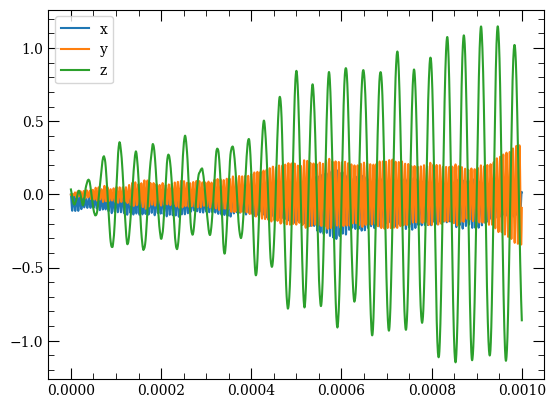

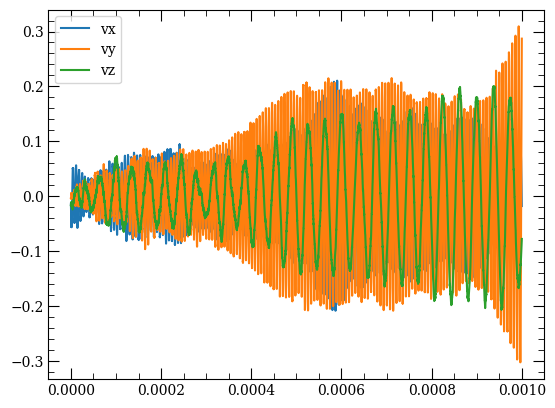

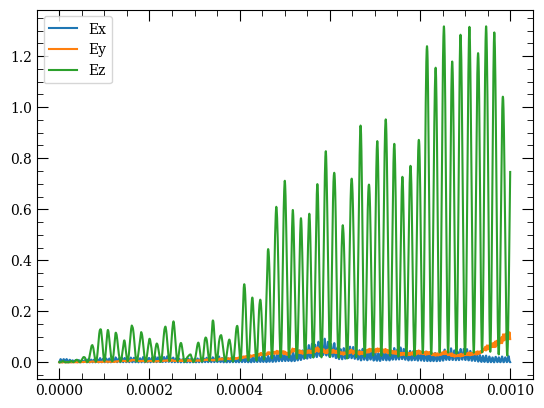

In [227]:
TrapR, TrapZ = OurSystem.TweezerConfig[0].trapR, OurSystem.TweezerConfig[0].trapZ
x, y, z = y_res[0, :]*1e6,  y_res[1, :]*1e6, y_res[2, :]*1e6
vx, vy, vz = y_res[3, :],  y_res[4, :], y_res[5, :]
print('x displacement ', max(x) - min(x))
print('y displacement ', max(y) - min(y))
print('z displacement ', max(z) - min(z))
print('average vx', np.average(vx))
print('average vy', np.average(vy))
print('average vz', np.average(vz))

print('Frequency vx', get_primary_frequency(t_res, vx)/TrapR)
print('Frequency vy', get_primary_frequency(t_res, vy)/TrapR)
print('Frequency vz', get_primary_frequency(t_res, vz)/TrapZ)
plt.plot(t_res, x, label='x')
plt.plot(t_res, y, label='y')
plt.plot(t_res, z, label='z')

plt.legend()
plt.show()
plt.plot(t_res, vx, label='vx')
plt.plot(t_res, vy, label='vy')
plt.plot(t_res, vz, label='vz')

plt.legend()
plt.show()

Ex =  vx**2 + x**2
Ey = vy**2 + y**2
Ez = vz**2 + z**2
plt.plot(t_res, Ex, label="Ex")
plt.plot(t_res, Ey, label="Ey")
plt.plot(t_res, Ez, label="Ez")
#plt.plot(t_res, Ex + Ey + Ez,label="ET")
plt.legend()
plt.show()

In [12]:
twe = OurSystem.TweezerConfig[0]
print(twe.I0*1e-7)
loc = 0e-6
twe.get_Fnet([loc, loc,loc], [0.0, 0.0, 0.0])

1.1451149418165694
[1.97855496e-21 1.97855496e-21 7.39707134e-23]


array([1.97855496e-21, 1.97855496e-21, 7.39707134e-23])

In [13]:
OurEnvir = OurSystem.envir[0]
I  = OurEnvir.Intensity[0]


7.0756633566109e-26

## Tweezer Test

### Amplitude Test

In [35]:
a = OurSystem.TweezerConfig[0]
print("Intensity: ", a.I0*(1000/1)*(1/(1e6)**2), " mW/um^2")
print("Power ", a.P0)
print("Damping Rate", a.Damping_rate*1e-6, "MHz")
print("Calculated Damping_rate", Consts['q_c']**2*a.omega_0**2/(6*pi*Consts['e0']*Consts['m_e']*Consts['c']**3)*1e-6, "MHz")
print("Tweezer Wavelength", a.wavelength_tweezer*1e9, "nm")
print("Transition Wavelength", a.wavelength_transition*1e9, "nm")
print("Omega_0", a.omega_0*1e-12, "THz")
print("waist", a.BP.waist*1e6, "um")
print("trap Frequency Z", a.trapZ*1e-6, "MHz")
print("Calculated power", a.trapZ**2*a.atom.mass*np.pi**3*a.BP.waist**6/(a.wavelength_tweezer**2)/4*1e3, "mW")
print("Calculated power", a.trapR**2*a.atom.mass*np.pi*a.BP.waist**4/8*1e3, "mW")
p0_laser = 10e-3
print("Calculated Frequency", sqrt(8*p0_laser/(np.pi*a.atom.mass*a.BP.waist**4))*1e-6, "MHz")
print("Calculed power with U0", a.U0*2*Consts['e0']*Consts['c']/np.real(a.alpha())*(1000/1)*(1/(1e6)**2)*pi*(a.BP.waist/2*1e6)**2*1e3, "mW")

Intensity:  0.011451149418165696  mW/um^2
Power  2.7599994512954883e-05
Damping Rate 28.657816036296826 MHz
Calculated Damping_rate 0.70367569948923 MHz
Tweezer Wavelength 1064.0 nm
Transition Wavelength 894.5929991351851 nm
Omega_0 335.1227410563453 THz
waist 1.2387110694713286 um
trap Frequency Z 0.182212373908208 MHz
Calculated power 1.812483697649243e-34 mW
Calculated power 1.8124836976492436e-34 mW
Calculated Frequency 2.2137780290255344e+17 MHz
Calculed power with U0 13.799997256477441 mW


In [15]:
a.omega_0**2/Consts['e0']*Consts['m_e']*Consts['c']**3

3.1136229067812746e+35

### Positional tests

#### Intensity

Maximum Intensity =  9527919.685171293


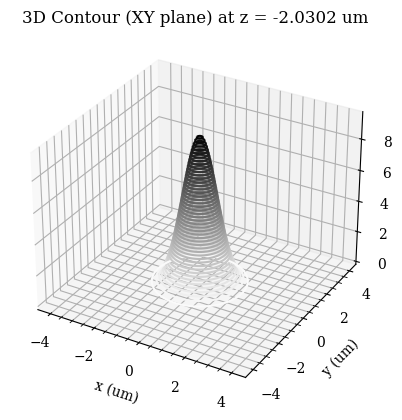

In [94]:
a = OurSystem.TweezerConfig[0]
X, Y, Z = OurSystem.grid
indtest = 49
zslice = Z[0, 0, indtest]
X = X[:, :, indtest]*1e6

Y = Y[:, :, indtest]*1e6
IntensityProfile_XY = a.Intensity[:, :, indtest]
print("Maximum Intensity = ", np.amax(IntensityProfile_XY))
np.shape(a.Intensity)

fig = plt.figure()
ax = plt.axes(projection='3d')
ax.contour3D(X, Y, IntensityProfile_XY,  50, cmap='binary')
ax.set_xlabel('x (um)')
ax.set_ylabel('y (um)')
ax.set_zlabel('Intensity')
ax.set_title(f'3D Contour (XY plane) at z = {round(zslice*1e6, 4)} um')
plt.show()


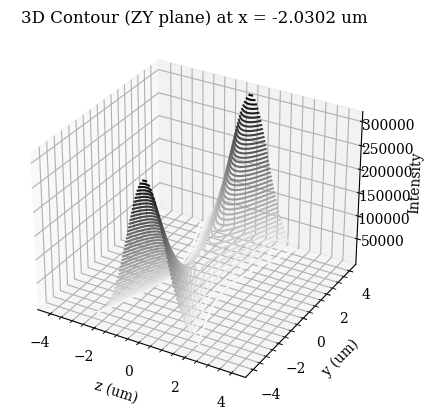

In [95]:
X, Y, Z = OurSystem.grid
indtest = 49
xslice =  X[indtest, 0, 0]
Z = Z[indtest, :,:]*1e6
Y = Y[indtest, :, :]*1e6
IntensityProfile_ZY = a.Intensity[indtest, :, :]
fig = plt.figure()
ax = plt.axes(projection='3d')
ax.contour3D(Y, Z, IntensityProfile_ZY,  50, cmap='binary')
ax.set_xlabel('z (um)')
ax.set_ylabel('y (um)')
ax.set_zlabel('Intensity')
ax.set_title(f'3D Contour (ZY plane) at x = {round(xslice*1e6, 4)} um')
plt.show()



#### Force

Text(0.5, 1.0, 'Vector Field')

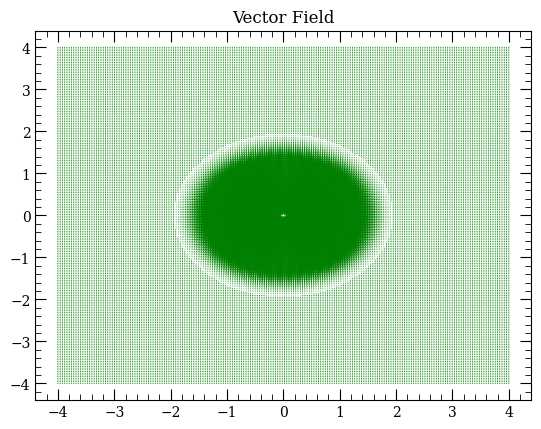

In [96]:
a = OurSystem.TweezerConfig[0]
X, Y, Z = OurSystem.grid
Fx, Fy, Fz = a.ForceGrid
indOI = 49

zOI = Z[0, 0, indOI]
#X = X[51:100, 51:100, indOI]*1e6
#Y = Y[51:100, 51:100, indOI]*1e6
#Fx = Fx[51:100, 51:100, indOI]/10
#Fy = Fy[51:100, 51:100, indOI]/10
X = X[:, :, indOI]*1e6
Y = Y[:,  :, indOI]*1e6
Fx = Fx[:, :, indOI]/10
Fy = Fy[:, :,  indOI]/10

plt.quiver(X, Y, Fx, Fy, color='g')
#plt.xlim(-5, 5)
#plt.ylim(-5, 5)
plt.title('Vector Field')

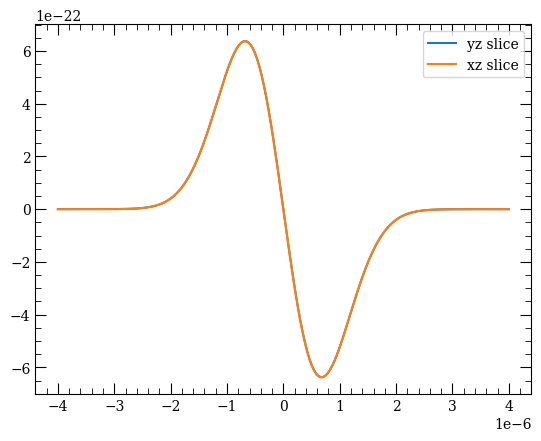

In [99]:
X, Y, Z = OurSystem.grid
Fx, Fy, Fz = a.ForceGrid
indOI_2 = 49
Fx_y = Fx[:, indOI_2, indOI]
x_y = X[:, indOI_2, indOI]
Fy_x = Fy[indOI_2, :, indOI]
y_x = Y[indOI_2, :, indOI]
plt.plot(x_y, Fx_y, label='yz slice')
plt.plot(y_x, Fy_x, label='xz slice')

plt.legend()

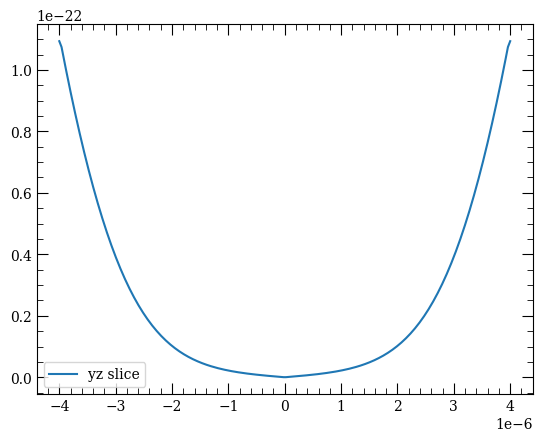

In [98]:
X, Y, Z = OurSystem.grid
Fx, Fy, Fz = a.ForceGrid
indOI_2 = 49
indOI = indOI_2

Fz_x = Fz[indOI_2, indOI, :]
z_x = Z[indOI_2, indOI, :]
plt.plot(z_x, abs(Fz_x), label='yz slice')
#plt.plot(y_x, Fy_x, label='xz slice')

plt.legend()

## Sanity check of Force Mag and Velocity 

In [22]:
T = 2e-6
np.sqrt(2*Consts['kb']*T/Cesium().mass)
for i in OurSystem.beams: 
    print( 1/(2*Consts['e0']*Consts['c'])*i.alpha())
    
    print(max(i.ForceBranch[0, :]))#print(Consts['hbar']*i.gamma*norm(i.k)/2)


(6.566971224572165e-33+1.1388423531014551e-39j)
7.360368244641368e-20


In [17]:
10E-3/1e5

1e-07

[1.97855496e-21 1.97855496e-21 7.39707134e-23]
[1.97855496e-21 1.97855496e-21 7.39707134e-23]
[-1.97855496e-21  1.97855496e-21  7.39707134e-23]
[-1.97855496e-21 -1.97855496e-21 -7.39707134e-23]
[-1.97855496e-21 -1.97855496e-21 -7.39707134e-23]
[-5.92305043e-21  5.92305043e-21  7.36563852e-23]
[-1.97855496e-21  1.97855496e-21  7.39707134e-23]
[1.97855496e-21 1.97855496e-21 7.39707134e-23]
[-1.97855496e-21  1.97855496e-21  7.39707134e-23]
[-1.97855496e-21 -1.97855496e-21 -7.39707134e-23]
[-1.97855496e-21 -1.97855496e-21 -7.39707134e-23]
[-1.97855496e-21  1.97855496e-21  7.39707134e-23]
[-1.97855496e-21  1.97855496e-21  7.39707134e-23]
[1.97855496e-21 1.97855496e-21 7.39707134e-23]
[-1.97855496e-21  1.97855496e-21  7.39707134e-23]
[-1.97855496e-21 -1.97855496e-21 -7.39707134e-23]
[-1.97855496e-21 -1.97855496e-21 -7.39707134e-23]
[-1.97855496e-21  1.97855496e-21  7.39707134e-23]
[-1.97855496e-21  1.97855496e-21  7.39707134e-23]
[1.97855496e-21 1.97855496e-21 7.39707134e-23]
[-1.97855496e-2

/Users/jluke/Desktop/Simulation/HighFieldImaging/ODE_Step.py:185: RuntimeWarning: divide by zero encountered in divide
  errmax  = np.max(np.abs(yerr/yscal)/eps)
/Users/jluke/Desktop/Simulation/HighFieldImaging/ODE_Step.py:185: RuntimeWarning: invalid value encountered in divide
  errmax  = np.max(np.abs(yerr/yscal)/eps)


[-1.97855496e-21  1.97855496e-21  7.39707134e-23]
[-1.97855496e-21  1.97855496e-21  7.39707134e-23]
[-1.97855496e-21  1.97855496e-21  7.39707134e-23]
[-1.97855496e-21  1.97855496e-21  7.39707134e-23]
[-1.97855496e-21  1.97855496e-21  7.39707134e-23]
[-1.97855496e-21  1.97855496e-21 -7.39707134e-23]
[-1.97855496e-21  1.97855496e-21 -7.39707134e-23]
[-1.97855496e-21  1.97855496e-21 -7.39707134e-23]
[-1.97855496e-21  1.97855496e-21 -7.39707134e-23]
[-1.97855496e-21  1.97855496e-21  7.39707134e-23]
[-1.97855496e-21  1.97855496e-21  7.39707134e-23]
[-1.97855496e-21  1.97855496e-21 -7.39707134e-23]
[-1.97855496e-21  1.97855496e-21 -7.39707134e-23]
[-1.97855496e-21  1.97855496e-21 -7.39707134e-23]
[-1.97855496e-21  1.97855496e-21 -7.39707134e-23]
[-1.97855496e-21  1.97855496e-21 -7.39707134e-23]
[-1.97855496e-21  1.97855496e-21 -7.39707134e-23]
[-1.97855496e-21  1.97855496e-21 -7.39707134e-23]
[-1.97855496e-21  1.97855496e-21 -7.39707134e-23]
[-1.97855496e-21  1.97855496e-21 -7.39707134e-23]


KeyboardInterrupt: 

In [27]:
np.sqrt(2*Consts['kb']*T/Cesium().mass)

0.015818856714719078

x displacement  0.10374715213030977
y displacement  0.04429179758159582
z displacement  0.01946186274131708
average vx 2.0974714755303022e-05
average vy 6.8537879446491e-06
average vz -3.3322937749732e-06


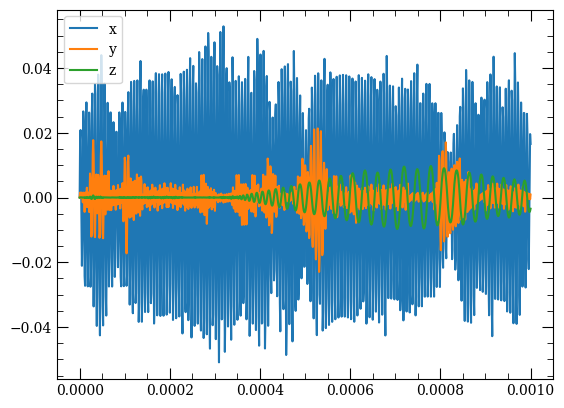

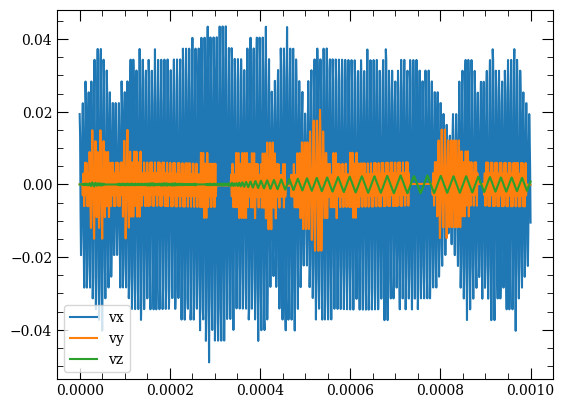

In [36]:
x, y, z = y_res[0, :]*1e6,  y_res[1, :]*1e6, y_res[2, :]*1e6
vx, vy, vz = y_res[3, :],  y_res[4, :], y_res[5, :]
print('x displacement ', max(x) - min(x))
print('y displacement ', max(y) - min(y))
print('z displacement ', max(z) - min(z))
print('average vx', np.average(vx))
print('average vy', np.average(vy))
print('average vz', np.average(vz))
plt.plot(t_res, x, label='x')
plt.plot(t_res, y, label='y')
plt.plot(t_res, z, label='z')
plt.legend()
plt.show()
plt.plot(t_res, vx, label='vx')
plt.plot(t_res, vy, label='vy')
plt.plot(t_res, vz, label='vz')
plt.legend()
plt.show()

## Tests for the futrue

(1)Turn off forces and see how it goes lmao
(2)


In [ ]:
x, y, z = y_res[0, :],  y_res[1, :], y_res[2, :]
plt.plot(t_res, x)

0.1111111111111111
Gradient along x: (10, 10)
Gradient along y: (10, 10)


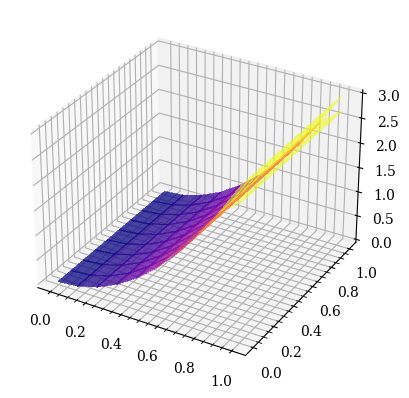

In [ ]:
import numpy as np
from mpl_toolkits.mplot3d import Axes3D


# create a 3D meshgrid
x, y= np.meshgrid(np.linspace(0, 1, 10),
                       np.linspace(0, 1, 10), indexing='ij')
# define a function associated with the meshgrid
f = x**3  + y**2
dfdx = 3*x**2
dfdy = 2*y
# find the gradients of the function
grad_x, grad_y = np.gradient(f)
grad_x = grad_x/np.diff(x, axis=0)[0, 0]
print(np.diff(x, axis=0)[0, 0])
# print the shape of the gradients arrays
print("Gradient along x:", grad_x.shape)
print("Gradient along y:", grad_y.shape)
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(x, y, dfdx, cmap="plasma",
                linewidth=0, antialiased=False, alpha=0.5)
ax.plot_surface(x, y, grad_x, cmap="plasma", linewidth=0.2, antialiased=False, alpha=0.5)

plt.show()

In [91]:
# create a 3D meshgrid
x, y, z= np.meshgrid(np.linspace(0, 1, 10),
                       np.linspace(0, 1, 10), np.linspace(0, 1, 10))
xproj = x[:, :, 0 ]
yproj = y[:, : , 0 ]
class Test: 
    def Intensity(I, x, y, z):
        r = project_onto_plane(np.array([x, y, z]), np.array([0, 0, 1]))
        z = project_onto_vector(np.array([x, y, z]),  np.array([0, 0, 1])) 
        w = lambda z: np.sqrt(1  + (z)**2)
        return I0*(BP.waist/w(z))**2*np.exp(-2*r**2/(w(z)**2))
Test.Intensity(1, x, y, z)

ValueError: shapes (3,10,10,10) and (3,) not aligned: 10 (dim 3) != 3 (dim 0)

In [89]:
import numpy as np

# create a 3D meshgrid
x, y, z = np.meshgrid(np.linspace(0, 1, 20), np.linspace(0, 1, 20), np.linspace(0, 1, 20), indexing='ij')

# define a force field as a function of x, y, and z
force = np.sin(np.pi * x) * np.sin(np.pi * y) * np.cos(np.pi * z)

# find the gradients of the force field
grad_x, grad_y, grad_z = np.gradient(force)

# print the shape of the gradients arrays
print("Gradient along x:", grad_x.shape)
print("Gradient along y:", grad_y.shape)
print("Gradient along z:", grad_z.shape)

Gradient along x: (20, 20, 20)
Gradient along y: (20, 20, 20)
Gradient along z: (20, 20, 20)


In [70]:
x, y, z= np.meshgrid(np.linspace(0, 1, 10),
                       np.linspace(0, 1, 10), np.linspace(0, 1, 10))
points = np.column_stack((x.ravel(), y.ravel(), z.ravel()))
points = np.transpose(points)
print(points.shape)
f = points[0] * points[1] + points[2]
print(f.shape)
fmesh_r = f.reshape(x.shape)
fmesh = x * y + z
np.all(fmesh == fmesh_r)

(3, 1000)
(1000,)


True

In [97]:
from scipy.integrate import solve_ivp

class MyClass:
    def __init__(self, a, b):
        self.a = a
        self.b = b

    def my_func(self, t, y, args):
        my_object = args
        return my_object.a * y + my_object.b

my_object = MyClass(2, 3)
sol = solve_ivp(my_object.my_func, t_span=[0, 1], y0=[1], args=(my_object,))
print(sol.y)


[[ 1.          1.33631998  5.05171284 16.97323671]]


In [98]:
a = [1, 2, 3]
b = [3, 4 ]
a + b

[1, 2, 3, 3, 4]

In [41]:
def AtomWrapper(AtomType):
    class Atom(object): 
        def __init__(self):
            self.eV2Hz = 2.417989242E14
        def findState(States, F, mf): 
            ind = np.intersect1d(np.where(States[1] == F),  np.where(States[2] == mf))
            if len(ind) > 1:
                return "Error"
            Energy = States[0]
            return Energy[0, ind[0]], ind[0]

        def Energy(self, n, l, j, f, mF, B): 
            States = self.atom.breitRabi(n, l, j, np.array([B]))
            return   CesiumWrapper.findState(States, f, mF)[0] + self.getEnergy(n, l, j)*self.eV2Hz 
        def getw0(self, stateI, stateF, B):
            return self.Energy(*stateF, B)  - self.Energy(*stateI, B) 
        def get_saturation_intensity(self, stateI, stateF):
            return self.getSaturationIntensity(*stateI, *stateF)
        def getTransitionRate(self, stateI, stateF):
            return self.atom.getTransitionRate(*stateF[0:3], *stateI[0:3])
    Atom = type('Atom', (Atom, AtomType, object), {})
    return Atom
AtomType = Cesium
ClassType = AtomWrapper(AtomType)
print(ClassType.mass)

<class 'arc.alkali_atom_data.Cesium'>
2.206946951453701e-25


In [66]:
Cesium().mass

2.206946951453701e-25

In [100]:
def sampleVelocities_BD(N, m, T=300):
    scale = np.sqrt((Consts['kb'] * T)/m)
    # Get N numbers from U[0,1]
    nums = st.uniform.rvs(size=N)
    # Use inverse cdf of maxwell dist:
    return st.maxwell.ppf(nums, scale=scale)
a = sampleVelocities_BD(10000, Cesium().mass)
a.shape

(10000,)

In [177]:
def decompose_spherical(pol): 
    return np.array([np.vdot(pol_v['pi'], pol), np.vdot(pol_v['sigma_p'], pol), np.vdot(pol_v['sigma_m'], pol)])

beamAngle = 75*np.pi/180
Bf = np.array([0, 0, 1])
direc = np.array([0, np.cos(beamAngle), -np.sin(beamAngle)])
Rot =  rotation_matrix(np.cross(Bf, direc), get_angle(Bf, direc))
rotated_pol =  Rot @ pol_v['sigma_p']
a = decompose_spherical(rotated_pol)
print('Sigma pi', np.abs(a[0])**2/norm(a)**2)
print('Sigma p',  np.abs(a[1])**2/norm(a)**2)
print('Sigma m',  np.abs(a[2])**2/norm(a)**2)

print(norm(rotated_pol))
print(norm(a))


Sigma pi 0.033493649053890136
Sigma p 0.00029026232852068305
Sigma m 0.9662160886175891
1.0
0.9999999999999999


In [ ]:
class Tweezer: 
    def __init__(self, stateI, stateF, wavelength, trapR, trapZ, BP):
        self.atom = Cesium()
        mass = self.atom.mass
        
        self.trapR = trapR
        self.trapZ = trapZ
        BP.waist = trapR/trapZ*(1/(np.pi*np.sqrt(2)))*wavelength
        BP.zr = GaussianBeam.get_raleighLength(BP.waist, wavelength)
        self.P0 = 1/8 * trapR**2 * np.pi* mass *BP.waist**4
        self.I0 = self.P0*2/(np.pi*BP.waist**2)
        self.U0 = 1/4 * mass*BP.waist**2 * trapR**2
        print(f"Trap Depth = {self.U0*Conversion['J2mK']}")
        
        
        self.PosTree = []
        self.ForceBranch = []
        self.Damping_rate = self.atom.getTransitionRate(*stateI, *stateF)
        self.omega_0 =  Consts['c']/self.atom.getTransitionWavelength(*stateI, *stateF)
        self.omega = Consts['c']/wavelength
        self.BP = BP
    def generateAtoms(self, AtomNum, T):
        posList = self.generateAtoms_Pos(AtomNum, T)
        velList = self.sampleVelocities_BD(AtomNum, T)
        ivs = []
        for i in range(len(posList)):
            ivs.append([*posList[i], *velList[i]])
        return np.array(ivs)      
    def generateAtoms_Pos(self, AtomNum, T): #Limitation to k in one of the axis
        coordList = []
        #Pulls the coordinate for x, y and z
        sigmaR = 1/self.trapR *np.sqrt(Consts['kb']*T/self.atom.mass)
        sigmaZ = 1/self.trapZ *np.sqrt(Consts['kb']*T/self.atom.mass)
        coordZ = np.random.normal(0, sigmaZ, AtomNum)
        coordR = np.random.normal(0, sigmaR, AtomNum)
        for i in range(AtomNum):
            x, y = coordR[i]*getSphereVec(2) 
            z = coordZ[i]
            if not np.all(self.BP.dir ==  np.array([0, 0, 1])):
                Rot = rotation_matrix(np.cross(np.array([0, 0, 1]), self.BP.dir), get_angle(np.array([0, 0, 1]), self.BP.dir))
                rotated_coord = Rot @ np.array([x, y, z])
            else:
                rotated_coord = np.array([x, y, z])
            coordList.append(rotated_coord + self.BP.Loc)
        return np.array(coordList)
    def sampleVelocities_BD(self, N, T):
        scale = np.sqrt((Consts['kb'] * T)/self.atom.mass)
        # Get N numbers from U[0,1]
        nums = st.uniform.rvs(size=N)
        # Use inverse cdf of maxwell dist:
        velocities = st.maxwell.ppf(nums, scale=scale)
        velList = []
        for i in velocities: 
            #print(1/2*self.atom.mass*i**2 *Conversion['J2mK'])
            velList.append(i*getSphereVec(3) ) #Velocites?
        return velList
    def alpha(self):
        return 6*np.pi*Consts['e0']*Consts['c']**3 * (self.Damping_rate/self.omega_0**2)/(self.omega_0**2 - self.omega**2 - 1j*(self.omega**3/self.omega_0**2)*self.Damping_rate)
    def alphaDet(self): #
        return (3*np.pi*Consts['c']**2*self.Damping_rate)/(2*self.omega_0**3)*(1/(self.omega_0-self.omega) + 1/(self.omega_0 - self.omega))
    def build_ForceTree(self, grid):
        x, y, z = grid
        Points = np.column_stack((x.ravel(), y.ravel(), z.ravel()))

        print("Calculating Intensities")
        Int_field = np.array(Parallel(n_jobs=10)(delayed(GaussianBeam.Intensity)(self.I0, pos, self.BP) for pos in Points))
        Imesh_r = Int_field.reshape(x.shape)
        Igrad_x, Igrad_y, Igrad_z = np.gradient(Imesh_r)
        Fx_m, Fy_m, Fz_m = 1/(2*Consts['e0']*Consts['c'])*np.real(self.alpha())*np.array([Igrad_x/np.diff(x[:, 0, 0])[0], Igrad_y/np.diff(y[0, :, 0])[0], Igrad_z/np.diff(z[0, 0, :])[0]])
        self.ForceBranch = np.array([Fx_m.ravel(), Fy_m.ravel(),Fz_m.ravel()])
    def set_PosTree(self, tree):
        print("Setting Tree")
        self.PosTree = tree
    def get_Fnet(self, pos, vel): 

        distances, indices = self.PosTree.query(pos, k=1)
        Fpot = self.ForceBranch[:, indices]
        print(Fpot)
        return Fpot
    

In [230]:
x = np.linspace(0, 10, 24000)
y = np.linspace(0, 20, 24000)

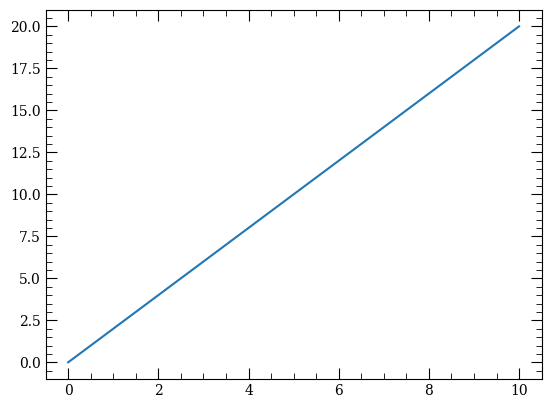

In [229]:
plt.plot(x, y)